<strong>The data I will be using is from Chicago police department and it contains all crimes reported during 2001 and 2017. The purpose of this <br>
analysis is  to find out where and when crimes occur. Is there a pattern in the occurenece of crimes? Are crimes affected by weather conditions  <br>
say: temperature? Is Chicago getting safer over these years, i.e., are crimes decreasing? What about certain types of crimes? Do certain types of  <br>
crimes show a differentpattern from others? We will try to address these questions in this notebook. </strong>

In [2]:
# First import the necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gmaps                                # Used for plotting data on google maps using an API
from matplotlib import cm          # To get certain color maps for plotting
import ipywidgets as widgets    # Display widgets to help visualization
import json
%config InlineBackend.figure_format = 'svg'
plt.style.use('seaborn')
pd.set_option('display.width', 500)
pd.set_option('max_columns', 60)

The data has been cleaned and wrangled to be used for the analysis. It is very large so here is an external link to the file: <br>
<a href="https://www.dropbox.com/s/t7bw99ef3sgwoht/crimes_new.csv?dl=0">Crime data download</a> <br>
This data set has all the entries for 8 major felonies and it's used for our analysis to find interesting trends or patterns.

In [3]:
# First read in the data
crimes=pd.read_csv('data/crime/crimes_new.csv', parse_dates=True)

In [3]:
# Check the data set
crimes.head()

,Date,Unnamed: 0,ID,Case Number,Date.1,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,date,index,LATITUDE,LONGITUDE,ELEVATION,DATE,PRCP,SNOW,SNWD,TAVG,TMAX,TMIN,weather_type
0,2001-01-01 00:00:00,0,3272413,HK299011,2001-01-01 00:00:00,076XX S EMERALD AVE,0842,THEFT,AGG: FINANCIAL ID THEFT,RESIDENCE,False,False,621,6.0,06,1172658.0,1854465.0,2001,03/31/2006 10:03:38 PM,41.756087,-87.642812,"(41.756086589, -87.642812325)",2001-01-01,0,41.995,-87.9336,201.8,2001-01-01,0.0,0.0,17.0,14.5,24.0,5.0,Unknown
1,2001-01-01 00:00:00,1,5508664,HN320275,2001-01-01 00:00:00,009XX N HARDING AVE,0266,SEX OFFENSE,PREDATORY,RESIDENCE,False,True,1112,11.0,02,1149843.0,1906023.0,2001,06/11/2007 03:52:33 PM,41.898041,-87.725087,"(41.898040875, -87.725087394)",2001-01-01,0,41.995,-87.9336,201.8,2001-01-01,0.0,0.0,17.0,14.5,24.0,5.0,Unknown
2,2001-01-01 00:00:00,2,2743135,HJ380339,2001-01-01 00:00:00,039XX N MOZART ST,0266,SEX OFFENSE,PREDATORY,APARTMENT,True,False,1733,17.0,02,1156711.0,1926359.0,2001,08/17/2015 03:03:40 PM,41.953708,-87.699309,"(41.953708013, -87.699309457)",2001-01-01,0,41.995,-87.9336,201.8,2001-01-01,0.0,0.0,17.0,14.5,24.0,5.0,Unknown
3,2001-01-01 00:00:00,3,2126730,HH368190,2001-01-01 00:00:00,060XX W ARDMORE AVE,0281,SEX OFFENSE,NON-AGGRAVATED,CHURCH/SYNAGOGUE/PLACE OF WORSHIP,False,False,1622,16.0,02,1135010.0,1938218.0,2001,08/17/2015 03:03:40 PM,41.986663,-87.778803,"(41.986663058, -87.778803492)",2001-01-01,0,41.995,-87.9336,201.8,2001-01-01,0.0,0.0,17.0,14.5,24.0,5.0,Unknown
4,2001-01-01 00:00:00,8,1329588,G025242,2001-01-01 00:00:00,061XX S COTTAGE GROVE AV,0820,THEFT,$500 AND UNDER,STREET,False,False,313,3.0,06,1182574.0,1864705.0,2001,08/17/2015 03:03:40 PM,41.783962,-87.606155,"(41.783961993, -87.606155349)",2001-01-01,0,41.995,-87.9336,201.8,2001-01-01,0.0,0.0,17.0,14.5,24.0,5.0,Unknown


In [4]:
# Verify we have a datatime index
crimes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3928123 entries, 0 to 3928122
Data columns (total 35 columns):
Date                    object
Unnamed: 0              int64
ID                      int64
Case Number             object
Date.1                  object
Block                   object
IUCR                    object
Primary Type            object
Description             object
Location Description    object
Arrest                  bool
Domestic                bool
Beat                    int64
District                float64
FBI Code                object
X Coordinate            float64
Y Coordinate            float64
Year                    int64
Updated On              object
Latitude                float64
Longitude               float64
Location                object
date                    object
index                   int64
LATITUDE                float64
LONGITUDE               float64
ELEVATION               float64
DATE                    object
PRCP                

In [4]:
# Convert Date columns to datetime and drop duplicate Date.1 column
crimes['Date']=pd.to_datetime(crimes['Date'])

In [5]:
# Set index
crimes.index=crimes['Date']

In [7]:
crimes.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3928123 entries, 2001-01-01 00:00:00 to 2017-11-12 23:30:00
Data columns (total 35 columns):
Date                    3928123 non-null datetime64[ns]
Unnamed: 0              3928123 non-null int64
ID                      3928123 non-null int64
Case Number             3928123 non-null object
Date.1                  3928123 non-null object
Block                   3928123 non-null object
IUCR                    3928123 non-null object
Primary Type            3928123 non-null object
Description             3928123 non-null object
Location Description    3928123 non-null object
Arrest                  3928123 non-null bool
Domestic                3928123 non-null bool
Beat                    3928123 non-null int64
District                3928123 non-null float64
FBI Code                3928123 non-null object
X Coordinate            3928123 non-null float64
Y Coordinate            3928123 non-null float64
Year                    3928123 no

In [6]:
# Drop Date.1 column
crimes.drop('Date.1', axis=1, inplace=True)

<h3> First question: Is Chicago getting safer over the course of 16 years? We can do a time series to find out </h3>

In [7]:
# First get the 8 felonies into a list for future plotting needs
crime_types=crimes['Primary Type'].value_counts().index.tolist()

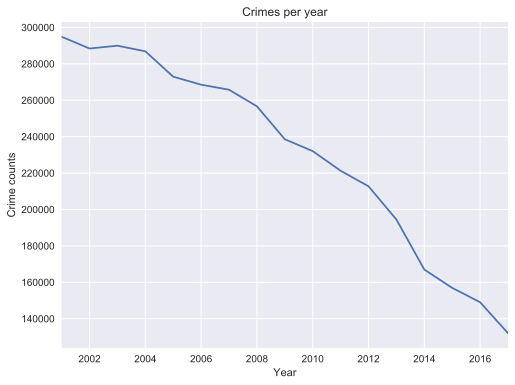

In [10]:
# Plot all crimes together as a time series
plt.figure(figsize=(8,6))
crimes['ID'].resample('A').count().plot()
plt.xlabel('Year')
plt.ylabel('Crime counts')
plt.title('Crimes per year')
plt.show()

<h3> Looking at the graph and all crimes as a whole, total crimes are going down from 2001 to 2017. So generally speaking, Chicago is getting safer </h3>

<h3> But what about individual crimes? Maybe certain crimes don't follow the trend. </h3>

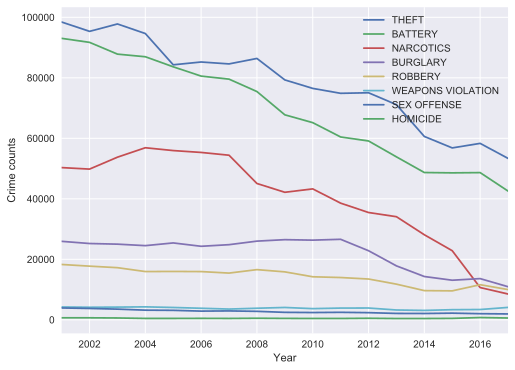

In [11]:
# Plot the 8 crime counts as a time series
plt.figure(figsize=(8, 6))
for c in crime_types:
    one_crime=crimes[crimes['Primary Type']==c]
    one_crime['Primary Type'].resample('A').count().plot(label=c)
plt.xlabel('Year')
plt.ylabel('Crime counts')
plt.legend()
plt.show()

<h3> By plotting the 8 crimes separately, we can see that: <br>
Theft, Battery, and Narcotics are indeed going down, however, Burglary and Robbery have a spike in year 2016. <br>
Moreover, Weapons violation even goes up from 2016 to 2017. Since some crimes happen less frequenlty than <br>
others, we should plot the bottom three on their own scale to see the trend. </h3>

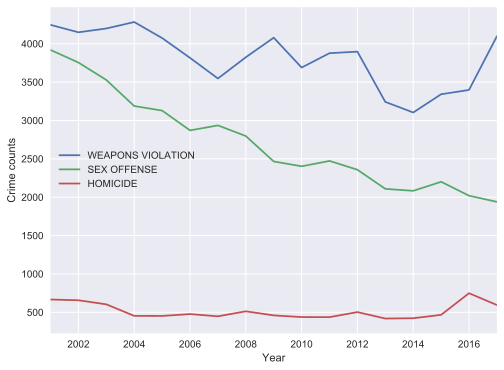

In [12]:
plt.figure(figsize=(8,6))
for c in ['WEAPONS VIOLATION', 'SEX OFFENSE', 'HOMICIDE']:
    one_crime=crimes[crimes['Primary Type']==c]
    one_crime['Primary Type'].resample('A').count().plot(label=c)
plt.xlabel('Year')
plt.ylabel('Crime counts')
plt.legend()
plt.show()

<h4>Looking at the above graph, we can see the sex offense is going down as a trend despite the fact that for certain years, it has some unusual peaks <br>
The most interesting findings are: first Weapons violation started to climbing quickly since 2014 and as we know that Chicago has somewhat strict <br>
gun laws where people are required to obtain a permit from Illinois state police to purchase a firearm and also they need to pass a background  <br>
check to finally complete the purchase. Then why is the number of weapon violation going up despite all the regulations?<br>
<br>
A little digging up on google has provided a reasonable answer to account for the high numbers of weapon violations. See the following article for<br>
more information: <a href="http://www.chicagotribune.com/news/columnists/glanton/ct-met-gun-control-chicago-dahleen-glanton-20171003-story.html"> Gun laws in Chicago</a>

<strong>Looks like people are buying weapons in neighboring states such as Indiana where a firearm can be purchased without and permit or <br>
background checks. Many firearms confiscated in Chicago were identified to come from neighboring states. But this answer is still not satifying. <br>
It explains where the firearms are from but it doesn't answer the question that what causes the sudden increase since year 2014? More work needs <br>
to be done to try to come up with an answer and it may be related to economy, education and/or poverty levels. </strong>

<strong>The second interesting finding is: what caused the substantial increase in homicide in 2016? With almost 750 homicides,  it is the highest of <br>
all the years analyzed here. Moreover, it coincides with the increase in weapons violations since 2014. Chicago may not be the murder capital in <br>
this country but the number is still alarming. Let's calculate the murder rate per capita in Chicago</strong>

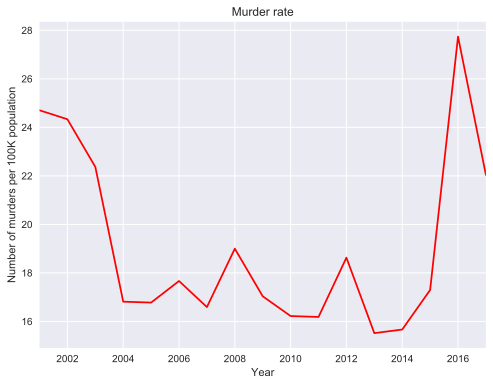

In [13]:
#Let's see the homicide rate per 100,000 people in Chicago
plt.figure(figsize=(8,6))
homicides=crimes[crimes['Primary Type']=='HOMICIDE']
homicides_count=homicides['Primary Type'].resample('A').count()
chicago_pop=2700000      # From google search
homicides_rate_per_100k=homicides_count/(chicago_pop/100000)
homicides_rate_per_100k.plot(color='red')
plt.title('Murder rate')
plt.xlabel('Year')
plt.ylabel('Number of murders per 100K population')
plt.show()

<strong>The sharp peak in 2016 is appalling and that's why I set it to red. With ~750 murders, it averages to 2 people killed everyday in 2016. Compared <br>
to St. Louis (59 per 100K in 2015) or Baltimore (55 per 100K in 2015) , Chicago's murder rate (~28 per 100K) still falls behind, but St. Louis has only  <br> 
1/9 of Chicago's population while Baltimore has a little less than 1/4. Work needs to be done to investigate the truth underlying the bloody murders  <br>
and hopefully the answer will shed light on how to mitigate this worsening situation<br>
This article has some useful information regarding murder rate in the US: <br>
<a href='http://bismarcktribune.com/news/national/the-cities-with-the-highest-murder-rates-in-the-us/collection_5a789407-4d43-5403-ad56-7c47880bda8e.html#30'> 30 Cities with highest murder rate</a></strong>

<h3>Second Question: Do certain months see more crimes than others? Since temperatures vary and our activities vary according to different months, maybe there is a relationship between month and crimes

In [14]:
# First let's break down the crimes by month and see if certain months have more incidents than others.
months=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
dfs=[]
for crime in crime_types:
    counts=[]
    for i in range(1,13):
        month=crimes[crimes.index.month==i]
        month_crime=month[month['Primary Type']==crime]
        counts.append(len(month_crime))
    dfs.append(pd.DataFrame({'Months': months, 'Number of incidents': counts}))
dfs[0]

,Months,Number of incidents
0,Jan,101034
1,Feb,85568
2,Mar,102301
3,Apr,105053
4,May,114390
5,Jun,118318
6,Jul,131789
7,Aug,131361
8,Sep,120047
9,Oct,120907


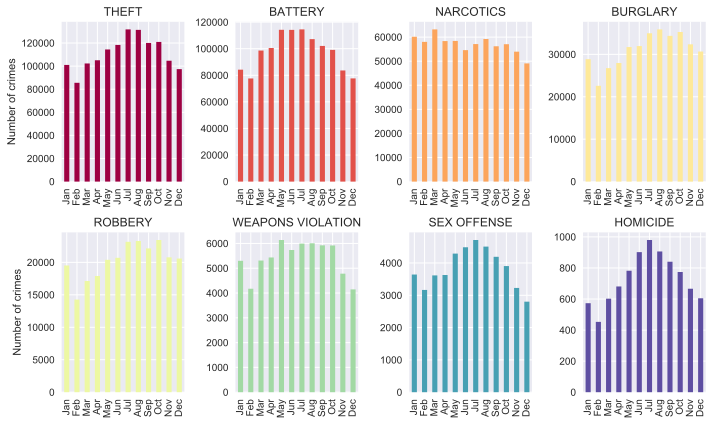

In [15]:
# Let's plot the 8 felonies by month
cmap=cm.get_cmap('Spectral')        # This is a good color map for visualization
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(10,6))
N=8
for k, df in enumerate(dfs):
    c = cmap(float(k)/(N-1))
    df.plot(kind='bar', x='Months', y='Number of incidents', ax=axes.flat[k], title=crime_types[k], color=c, legend=False)
for i in range(8):
    axes.flat[i].set_xlabel('')
for i in [0, 4]:
    axes.flat[i].set_ylabel('Number of crimes')
plt.tight_layout()
plt.show()

<strong>Interesting finding here is: while all crimes seem to peak around July, Narcotics sees the highest number in March. The high occurences of <br>
crimes around the month of July could be explained by temperature. In warmer month, people have more outside activities thus crimes increase. <br>
So the question is: do all of these crimes mostly occur outdoors? We can plot the location of crimes to find out.</strong>

In [16]:
# Get the top 5 locations for all crimes
crime_loc_counts=[]
for c in crime_types:
    crime_type=crimes[crimes['Primary Type']==c]
    crime_loc=crime_type['Location Description'].value_counts()[0:5]
    crime_loc_counts.append(crime_loc)

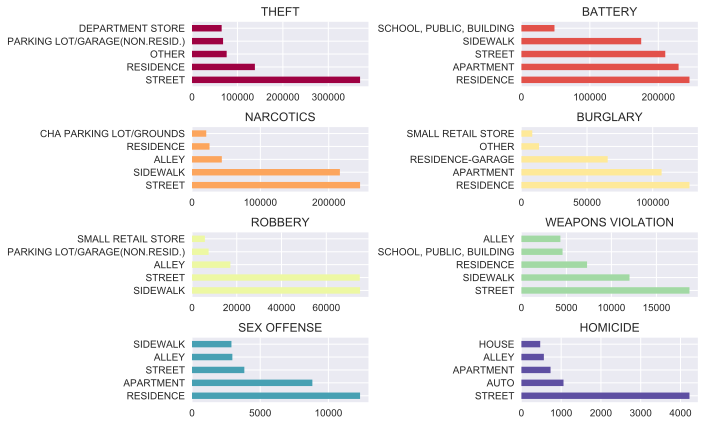

In [17]:
# Plot locations for all crimes
fig, axes=plt.subplots(nrows=4, ncols=2, figsize=(10,6))

for i, s in enumerate(crime_loc_counts):
    c=cmap(float(i)/(N-1))
    s.plot(kind='barh', color=c, ax=axes.flat[i], title=crime_types[i])
plt.tight_layout()
plt.show()

<strong>For most crimes, the top location is Street, however, for Battery and Sex offense, they mostly happen indoors (residence or apartment). While <br>
it's no surprise to see that most Burglary happen at residence or apartment by definition. What's puzzling here is that for Narcotics, the top <br>
locations are 'Street' and 'Sidewalk', then why do most Narcotics incidents happen in February and March. In Chicago, those two months are pretty <br>
cold. We can plot average temperatures by month to verify that.</strong>

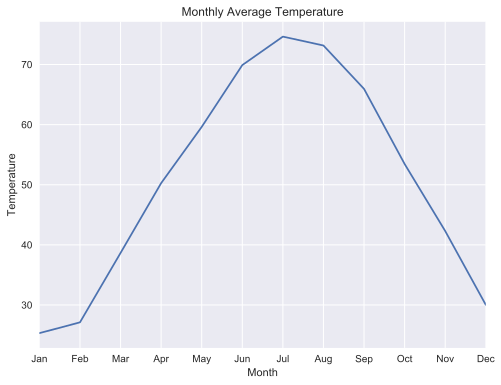

In [18]:
# Plot average temperatures by month in Chicago
temps=[]
for i in range(1,13):
    month=crimes[crimes.index.month==i]
    month_temp_avg=month['TAVG'].mean()
    temps.append(month_temp_avg)
plt.figure(figsize=(8,6))
monthly_avg_temp=pd.Series(temps, index=months)
monthly_avg_temp.plot()
plt.title('Monthly Average Temperature')
plt.xlabel('Month')
plt.ylabel('Temperature')
plt.xticks(np.arange(12), months)
plt.show()

<strong>As shown from the figure, February and March indeed have very low temperatures. We can also make a histogram to see if most crimes occur<br>
in higher temperatures</strong>

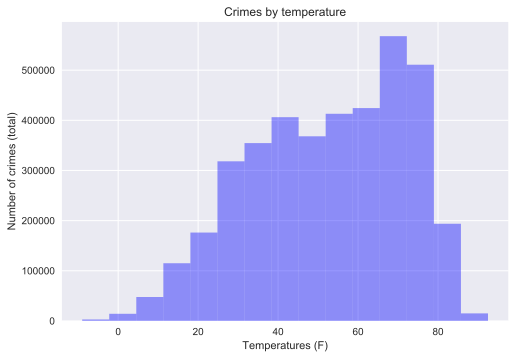

In [19]:
# We will use seaborn to plot the histogram as it looks better and privides more controls
sns.distplot(crimes['TAVG'], bins=15, kde=False, color='blue')
plt.xlabel('Temperatures (F)')
plt.ylabel('Number of crimes (total)')
plt.title('Crimes by temperature')
plt.show()

<strong>We can see from the above figure, most crimes happen in higher temperatures around 70 degrees. Another interesting finding here is that :<br>
at very high temperatures (>80 degrees), crimes also drop.<br>
Since most crimes do occur at higher temperatures, the abnormally high incident counts of Narcotics in colder month is intriguing. More work and <br>
data are needed to answer that question. Let's do a histogram for each individual crime to see this phenomenon.</strong>

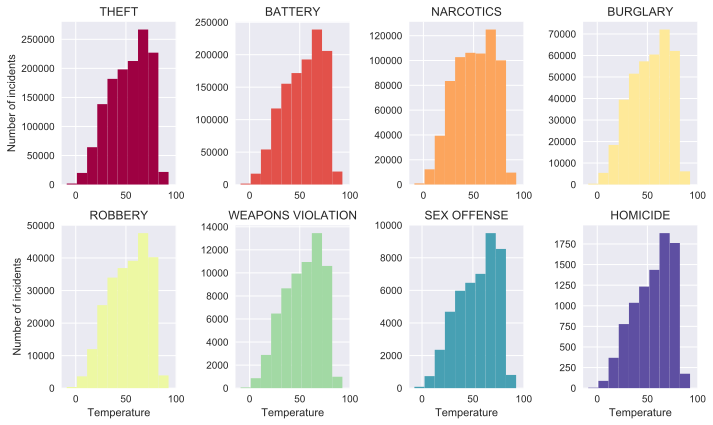

In [20]:
fig2, axes2=plt.subplots(nrows=2, ncols=4, figsize=(10,6))
for i, c in enumerate(crime_types):
    crime_type=crimes[crimes['Primary Type']==c]
    color=cmap(float(i)/(N-1))
    crime_type['TAVG'].plot.hist(bins=10, ax=axes2.flat[i], color=color, title=c)
    axes2.flat[i].set_xticks(np.linspace(0,100, 3))
    axes2.flat[i].set_ylabel('')
axes2.flat[0].set_ylabel('Number of incidents')
axes2.flat[4].set_ylabel('Number of incidents')
axes2.flat[4].set_xlabel('Temperature')
axes2.flat[5].set_xlabel('Temperature')
axes2.flat[6].set_xlabel('Temperature')
axes2.flat[7].set_xlabel('Temperature')
plt.tight_layout()
plt.show()

<strong>Look at the unusual shoulder for Narcotics around 30-40 degrees. It confirms the finding when doing the monthly plots</strong>

<h3> Third question: do certain days of the week see more crimes than others? Since temperature shouldn't vary that much during a week, something
else may be involved.

In [21]:
# We can break down all crimes by day of the week and see their distributions
weekdays=['Mo', 'Tu', 'We', 'Th', 'Fr', 'Sa', 'Su']
weekly_dfs=[]
for crime in crime_types:
    counts=[]
    for i in range(0,7):
        weekly=crimes[crimes.index.weekday==i]
        weekly_crime=weekly[weekly['Primary Type']==crime]
        counts.append(len(weekly_crime))
    weekly_dfs.append(pd.DataFrame({'Weekday': weekdays, 'Number of incidents': counts}))
weekly_dfs[0]

,Number of incidents,Weekday
0,192894,Mo
1,193222,Tu
2,194380,We
3,191350,Th
4,206535,Fr
5,188276,Sa
6,166141,Su


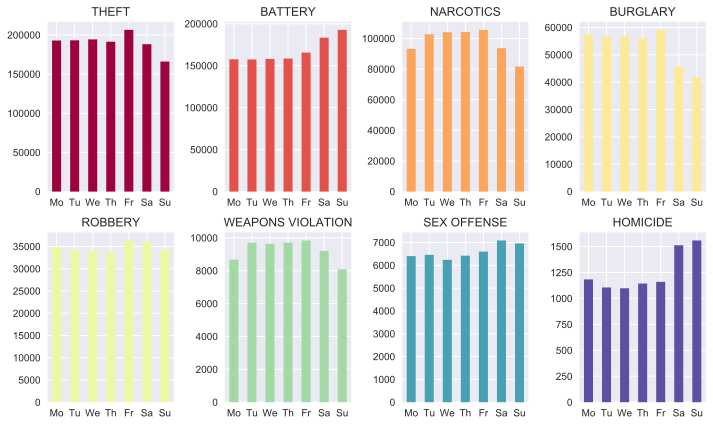

In [22]:
fig3, axes3= plt.subplots(nrows=2, ncols=4, figsize=(10, 6))
N=8
for k, df in enumerate(weekly_dfs):
    c = cmap(float(k)/(N-1))
    df.plot.bar(x='Weekday', y='Number of incidents', ax=axes3.flat[k], title=crime_types[k], color=c, legend=False, xticks=[])
for i in range(8):
    axes3.flat[i].set_xlabel('')
plt.tight_layout()
plt.show()

<strong>From this plot, we can extract some useful information. First, battery seems to be high on the weekend and it makes sense if we also look at <br>
the location plot above. Battery mostly happens at residence or apartment and people are more likely to be home on the weekend. On the other <br>
hand, Burglary seems to be lower on the weekend. It also makes sense because when most people are home, burglary is less likely to happen. <br>
Theft  is the highest on Friday while homicide is the highest on Sunday maybe when there is no school. Other information is needed to dig further <br> 
for this pattern</strong>

<h3>Fourth question: how are the crimes spread out during a 24 h period of the day? Are some hours more dangerous than others?

In [23]:
# Break down the crime by hour
hours=['12 am']+[str(x)+ ' am' for x in range(1, 12)]+['12 pm']+ [str(y) +' pm' for y in range(1, 12)]
hourly_dfs=[]
for crime in crime_types:
    counts=[]
    for i in range(24):
        hourly=crimes[crimes.index.hour==i]
        hourly_crime=hourly[hourly['Primary Type']==crime]
        counts.append(len(hourly_crime))
    hourly_dfs.append(pd.DataFrame({'Hours': hours, 'Number of incidents': counts}))
hourly_dfs[0]

,Hours,Number of incidents
0,12 am,75481
1,1 am,30391
2,2 am,24315
3,3 am,19394
4,4 am,14574
5,5 am,14264
6,6 am,20509
7,7 am,33168
8,8 am,51004
9,9 am,69721


In [24]:
# Let's plot all crime rates by hours
# Calculate crime percentage during 24h period
for df in hourly_dfs:
    df['Crime rate']=df['Number of incidents']/df['Number of incidents'].sum()

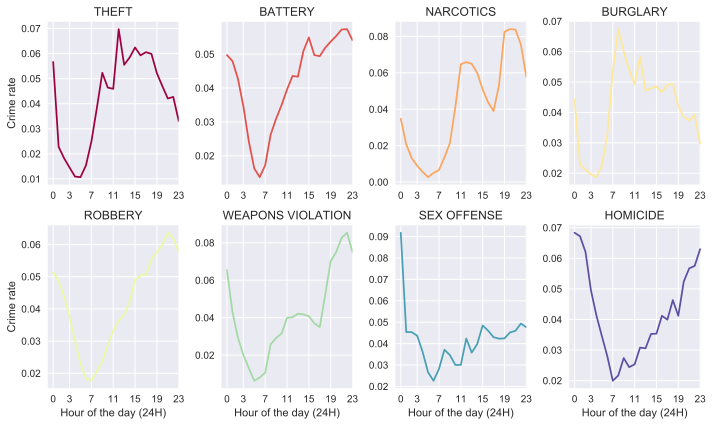

In [25]:
fig4, axes4= plt.subplots(nrows=2, ncols=4, figsize=(10,6))
N=8
for k, df in enumerate(hourly_dfs):
    c = cmap(float(k)/(N-1))
    df.plot(x=np.arange(24), y='Crime rate', ax=axes4.flat[k], title=crime_types[k], color=c, legend=False)
for i in range(8):
    #axes4.flat[i].xaxis.set_major_locator(plt.MultipleLocator(4))
    axes4.flat[i].xaxis.set_major_locator(plt.FixedLocator(np.array([0, 3, 7, 11, 15, 19, 23])))
    axes4.flat[i].set_xlim((-1,23))
for i in range(4,8):
    axes4.flat[i].set_xlabel('Hour of the day (24H)')
for i in [0, 4]:
    axes4.flat[i].set_ylabel('Crime rate')
plt.tight_layout()
plt.show()

<strong>This is a very interesting plot. Three crimes show similar pattern: "Battery, Robbery and Homicide". They peak at late night and low in the <br>
morning. As it gets darker and darker (from noon to almost midnight), more and more of these three crimes happen. Darkness is still the best cover <br>
for crimes. On the other hand, Theft peaks around 12pm. This is indicative of the time when most people are outside since most thefts happen in <br>
the street. Another interesting pattern is Narcotics which has two distince peaks at around 12pm and 8pm. Without further information, it's going <br>
to be hard to decipher this mystery. Last but not the least, for Burglary crimes, the highest peak is 8am. Any thoughts? Maybe that's because most<br>
people would have left their houses for work around that time and intruders tend to break in assuming no one is home.</strong>

<h3>Last question: where are crimes in terms of geographic location? Do some "bad" areas attract more criminals?

Since latitudes and longitudes of all crimes are known, we can try to build a heat map to show where crimes concentrate. I will use gmaps package to <br>
indicate crimes on top of google maps for nice visualization.

In [8]:
# Load google static map API key. You need a google API key to use their maps
api_key=open('data/api_key.txt')
gmaps.configure(api_key=api_key.read())
api_key.close()

<strong>To obtain your own API key see the following page:  <a href="https://developers.google.com/maps/documentation/static-maps/">Google API key</a>

In [9]:
# We can center on Chicago by its coordinates
chicago_coord=(41.8781, -87.6298)
fig=gmaps.figure(display_toolbar=False, center=chicago_coord, zoom_level=11)
fig._map.layout.width = '475px'    # Set map width
fig._map.layout.height = '600px'   # Set map height

# Since there are way too many data points (>3M) and it will make the map really slow. We will just show crimes of years 2016 and 2017
crime_layer=gmaps.heatmap_layer(crimes.loc['2016':'2017', ['Latitude', 'Longitude']], max_intensity=500)
fig.add_layer(crime_layer)
fig

A Jupyter Widget

<strong>From the above map we can see that there are three major clusters of crimes: 1. The downtown area  2. The West side   3. The South <br>
Since this map shows all crimes and of course different crimes will happen in different areas but this still gives some insights into where crimes <br>
occur the most in the city. What's interesting is that, the west and south are known to be "bad areas" but the north is usually a good area. Why is <br>
there a cluster just right north of Lincoln Park? Maybe certain crimes tend to happen there even though the social class is better? These are further <br>
questions that can be explored. </strong>

<h3> Conclusion: <br>
1. Overall crimes are going down in Chicago (except Weapons Violation). However, the huge spike of homicide in 2016 is disturbing and worth investigation.<br><br>
2. Crimes tend to happen in warm month where temperatures are around 70 degrees with the exception of Narcotics violations. This is an interesting find and can be explored if more information is known.<br><br>
3. Different crimes spread out differently during the week. As shown by the corresponding figure,  battery seems to be high on the weekend on the other hand, Burglary seems to be lower on the weekend. Theft is the highest on Friday while homicide is the highest on Sunday. <br><br>
4. Battery, Robbery and Homicide peak at late night and low in the morning. On the other hand, Theft peaks around 12pm. Another interesting pattern is Narcotics which has two distince peaks at around 12pm and 8pm. For Burglary crimes, the highest peak is 8am. These could be further explored if combined with more useful information.<br><br>
5. Finally, based on the map visualization, we have identified some hot areas for crimes to happen. The truth behind these clusterings could be revealed by using statistics in those areas such as income level, poverty, education level or demographics. <br><br>